In [39]:
import Pkg; Pkg.add("Colors")
import Pkg; Pkg.add("ColorVectorSpace")
import Pkg; Pkg.add("Images")
import Pkg; Pkg.add("ImageShow")
import Pkg; Pkg.add("FileIO")
import Pkg; Pkg.add("ImageIO")
import Pkg; Pkg.add("HypertextLiteral")


using Images

begin
    using Colors, ColorVectorSpace, ImageShow, FileIO, ImageIO
    using HypertextLiteral
end
url = "https://user-images.githubusercontent.com/6933510/107239146-dcc3fd00-6a28-11eb-8c7b-41aaf6618935.png"

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Chan

"https://user-images.githubusercontent.com/6933510/107239146-dcc3fd00-6a28-11eb-8c7b-41aaf6618935.png"

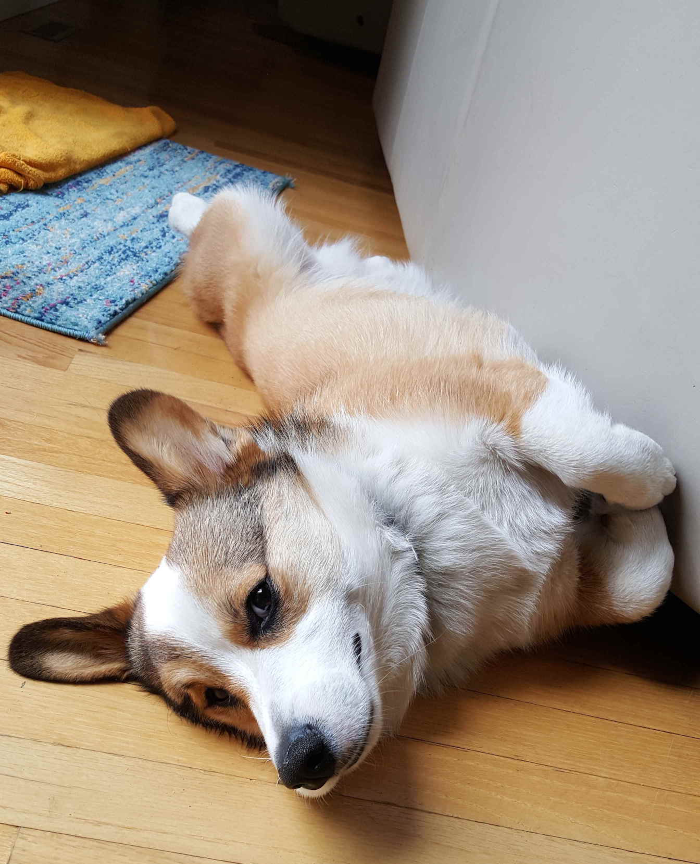

In [40]:
philip_filename = download(url) # download to a local file. The filename is returned
philip = load(philip_filename)
philip

Como pedido no item 1 da tarefa, irei criar na mão a função reverse do julia e irei testar no próprio philip. Na pasta que vou enviar com o código vai ter o pdf dos meus rascunhos de ideias, o primeiro desenho mostra como a função reverse age na matrix de modo horizontal, e a ideia é a mesma quando usamos argumento pedindo que ela faça isso de modo vertical.

In [41]:
function reverse_de_cria(matriz,sentido=1)
    x = div(size(philip)[1],2) # metade da qtdd de linhas
    y = div(size(philip)[2],2) # metade da qtdd de colunas 
    
    # usei div em vez de / porque caso seja um número par de linhas ou coluna, andaremos metade do caminho invertendo
    # e no meio continua igual, quando espelhamos.
    
    if sentido==1
        for i in 1:size(philip)[1]
            for j in 1:y
                temp = matriz[i,j]
                matriz[i,j] = matriz[i,end-j+1]
                matriz[i,end-j+1] = temp
            end
        end
    elseif sentido==2
        for i in 1:x
            for j in 1:size(philip)[2]
                temp = matriz[i,j]
                matriz[i,j] = matriz[end-i+1,j]
                matriz[end-i+1,j] = temp
            end
        end
    end
end

reverse_de_cria (generic function with 2 methods)

Agora vamos para o item 2 que é criar uma imagem nova usando pelo menos 3 funções que usamos em sala (concatenação, tirar alguma cor, reverse, etc).

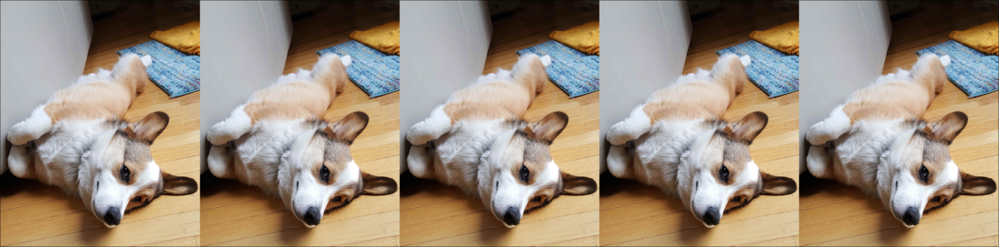

In [43]:
[ philip philip philip philip philip ] # criando a primeira parte da nossa imagem nova, o exército de philips comuns

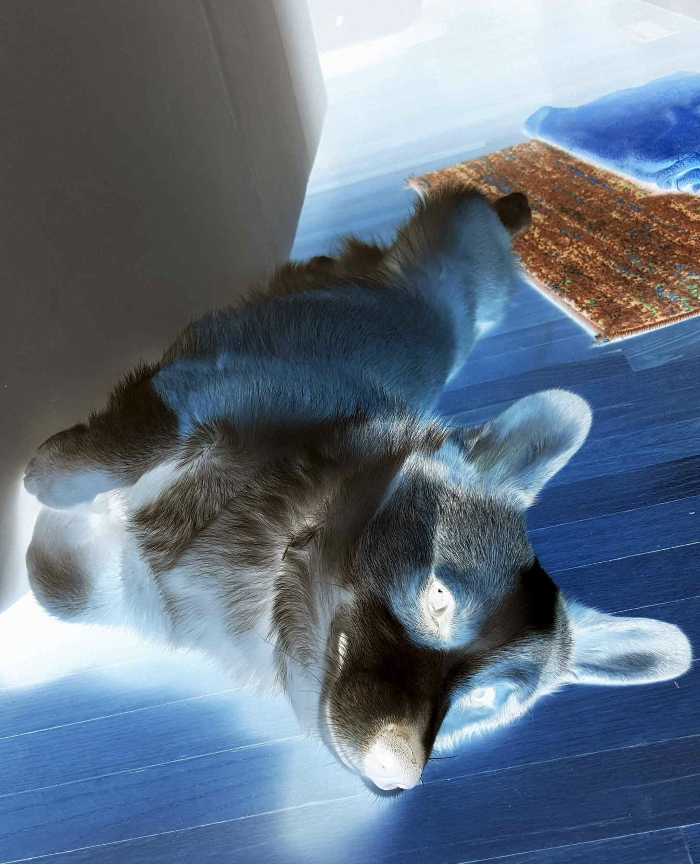

In [44]:
dark_philip = RGB(1,1,1) .-philip # criando um dark_philip, que veio de outra dimensão

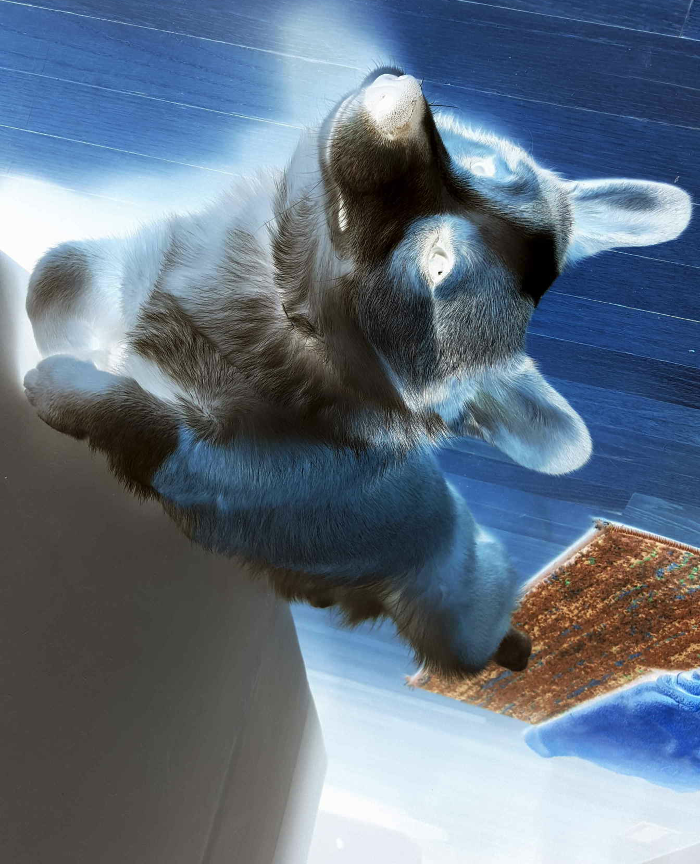

In [45]:
reverse_de_cria(dark_philip,2)  # invertendo a direção que ele está olhando para ficar de frente aos outros philips.
dark_philip   

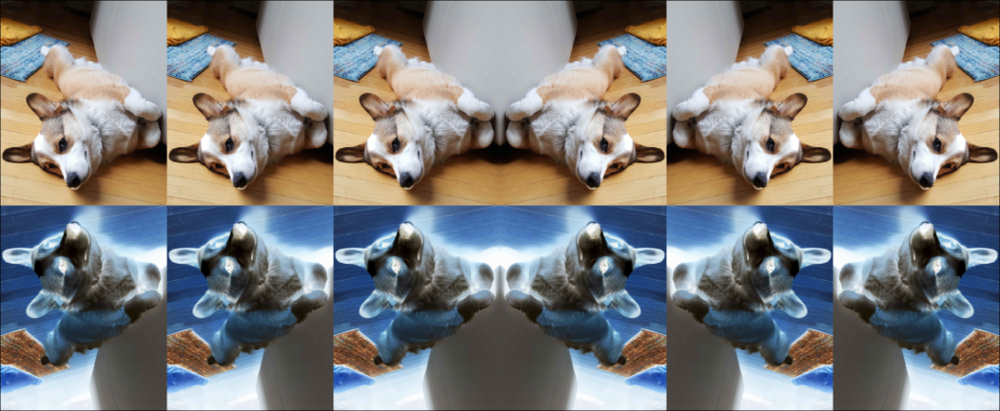

In [59]:
[reverse(philip,dims=2) reverse(philip,dims=2) reverse(philip,dims=2) philip philip philip ; reverse(dark_philip,dims=2) reverse(dark_philip,dims=2) reverse(dark_philip,dims=2) dark_philip dark_philip dark_philip ] 

A imagem acima usa o conceito de broadcasting para inverter a cor do philip, concatena as imagens e usei reverse, como pedido, 3 alterações na imagem, e o nome do quadro é "A guerra dos philips". Onde os philips do mundo invertido enfrentam os philips da terra. 

Agora o item 3 é criar alguma função sua que faça uma transformação em um único pixel e depois usar o broadcasting para transformar a imagem toda. 

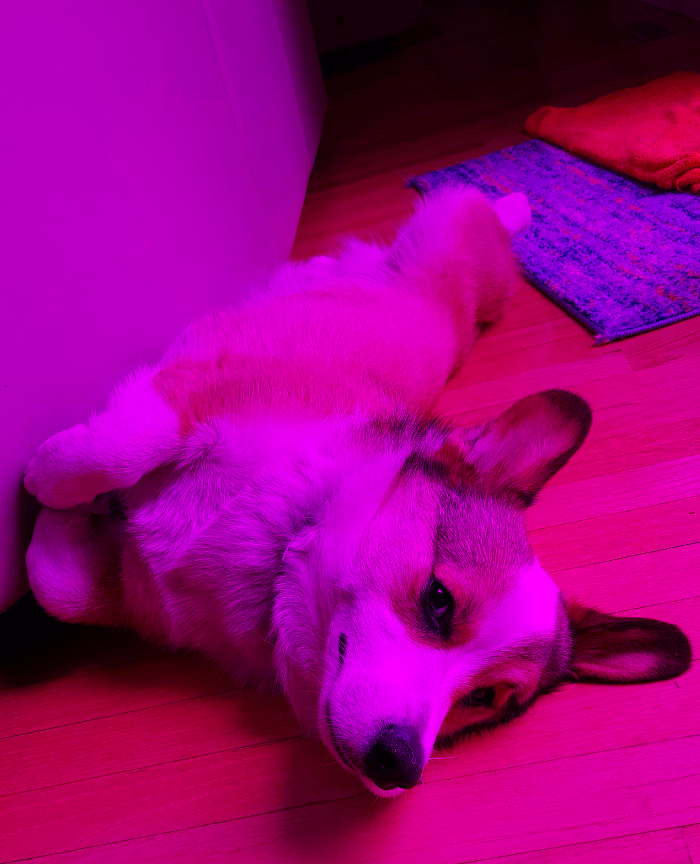

In [47]:
function tira_vermelho(rgb)
   return RGB(0,rgb.g,rgb.b)
end

function tira_verde(rgb)
   return RGB(rgb.r,0,rgb.b)
end

function tira_azul(rgb)
   return RGB(rgb.r,rgb.g,0)
end

philip2 = copy(philip)

tira_verde.(philip2)

Ai temos um philip meio clima de dia dos namorados.

Pesquisando na internet, descobri que existem diversas formas de se transformar uma imagem colorida em uma preta e branca.

A mais simples seria a que consiste em que intensidade de cinza de um pixel é dada pela média dos valores dos canais de cor RGB do pixel. Ou seja, valor de cinza = (R + G + B) / 3. Mas não ficou satisfatório o resultado.

In [48]:
function preto_e_branco1(pixel)
    R = pixel.r
    G = pixel.g
    B = pixel.b
    
    cor = ( R + G + B )/3 # cor normalizada para tom de cinza
    return RGB(cor,cor,cor)
end

preto_e_branco1 (generic function with 1 method)

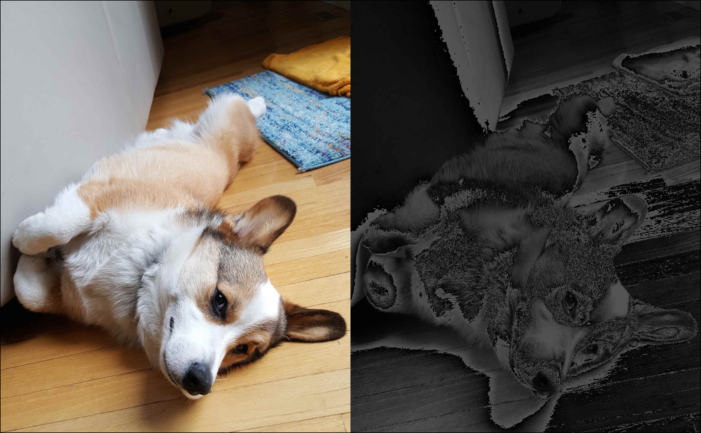

In [49]:
[philip3 preto_e_branco1.(philip3)] # botei uma do lado da outra para comparação.

Certamente dava pra dar como missão cumprida, mas achei que onde tem sombra não está sendo bem representada, meio feio e o philip que era bonitinho recebeu uma vibe meio chaotic. 

Perguntei para o chatGPT se o problema estava na minha interpretação matemática da situação e ele disse que o código está correto e que a transformação para preto e branco usando a média dos valores dos canais RGB pode resultar em uma imagem que parece estranha ou desbotada, especialmente se a imagem original tiver muitas cores diferentes e contrastes fortes, que é o caso, a imagem do philip possui muitas sombras e ele mesmo é preto, marrom, branco e cinza, o que causa esse desbotamento. E ai a própria resposta do chatGPT foi o método de conversão para escala de cinza usando a luminância ITU-R BT.601. Que atribui pesos para cada canal, de acordo com os níveis de nitidez adequados para os olhos humanos, uma técnica mais sofisticada e que eu nunca conseguiria descobrir sozinho. 

In [50]:
function preto_e_branco2(pixel)
    R = pixel.r
    G = pixel.g
    B = pixel.b
    
    cor = ( 0.299*R + 0.587*G + 0.114*B ) # cor normalizada para tom de cinza
    return RGB(cor,cor,cor)
end 

preto_e_branco2 (generic function with 1 method)

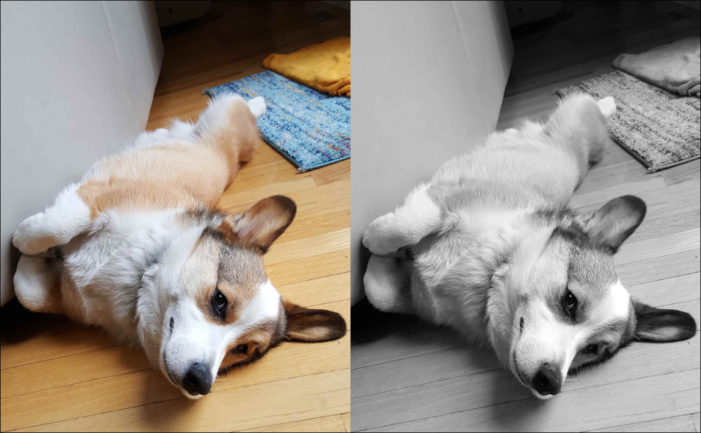

In [51]:
philip3 = copy(philip)
[philip3 preto_e_branco2.(philip3)]

5 - Na aula, fizemos um função que faz a subamostragem de uma imagem. Essa operação claramente não é inversível. Escreva uma função que tenta inverter essa função da melhor maneira possível.

A função que fizemos de subamostragem foi: 

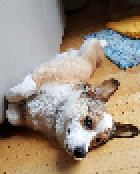

In [52]:
philip[1:10:864,1:10:700]

Mas como ela é bem especifica pro philip vou fazer uma mais abrangente, só por capricho.

In [53]:
function subamostragem(img,x)  # reduz a resolução de uma imagem em x vezes
   return img[1:x:size(img)[1],1:x:size(img)[2]] 
end

subamostragem (generic function with 1 method)

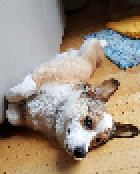

In [54]:
subamostragem(philip3,10)

Agora precisamos dar um jeito de fazer a inversa dessa função, ou seja, voltar para o philip com resolução maior, o que é um problema, por que antes nós precisavamos descartar informações, agora precisamos recuperar, e não temos mais essas informações.

A forma discutida em sala seria usar interpolação, usando os vizinhos mais próximos para simplesmente replicar o valor do pixel próximo e criar uma recuperação não tão perfeita. Em casos mais perfeitos de predição, algo mais sofisticado deve ser feito.

In [56]:
function superamostragem(img,n)
    img2 = zeros(RGB{Float64}, size(img,1)*n, size(img,2)*n)

    # um for que vai preencher as posições da imagem menor mas espaçadas , e depois vamos com outro for 
    # preencher os espaços vazios com pixels, com isso entao uma imagem que estava com tamanho 
    # (87,70) vira uma de (870,700) para N = 10, entao esse img2 após sua inicialização tem por exemplo
    # 87 RGB's com 9 0's entre cada item. 

    for i = 0:size(img,1)-1
        for j = 0:size(img,2)-1
            img2[i*n+1,j*n+1] = img[i+1,j+1]
        end
    end

    
    # agora a ideia vai ser andar por todos os pixels que eu criei por default como 0 na nossa matriz expandida
    # que é n vezes maior que a original e substituir esse pixel preto por uma média de todos pixels ao seu arredor.
    # vou pegar as duas diagonais, quem está encima, embaixo dos lados e tirar a média, mas só vou coletar os vizinhos
    # que já tiverem sido preenchidos ou forem da matriz original, se não eu lotaria a minha imagem de preto atoa.
    # ( sei disso porque fiz isso primeiramente e fiquei horas pra descobrir o porque tava errado )
    
    for i = 2:size(img2,1)-1
        for j = 2:size(img2,2)-1
            if img2[i,j] == RGB(0,0,0)
                
                #abaixo defino os pixels vizinhos
                p1 = img2[i,j-1] #esquerda
                p2 = img2[i,j+1] #direita
                p3 = img2[i+1,j+1] #inferior direito
                p4 = img2[i-1,j+1] #superior direito
                p5 = img2[i+1,j-1] #inferior esquerdo
                p6 = img2[i-1,j-1] #inferior direito
                p7 = img2[i-1,j] #acima
                p8 = img2[i+1,j] #debaixo
                
                #crio um contador de pixels não (0,0,0) e inicializo um somatório em formato de RGB
                count = 0
                total = RGB(0,0,0)
                
                for p in [p1, p2, p3, p4, p5, p6, p7, p8]
                    if p != RGB(0,0,0)
                        total += p
                        count += 1
                    end
                end
                
                #faço a média dos vizinhos não nulos
                if count > 0
                    img2[i,j] = total / count
                end
            end
        end
    end

    return img2
end


superamostragem (generic function with 1 method)

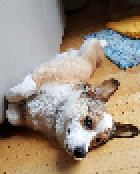

In [57]:
img = subamostragem(philip3,10)


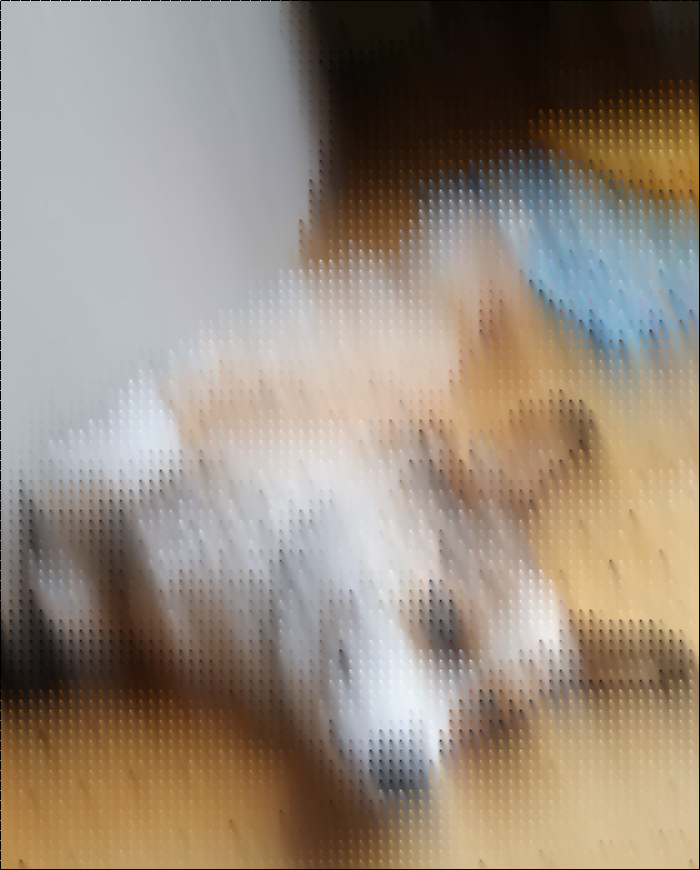

In [60]:
superamostragem(img,10)